In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
C19usa = pd.read_csv('US_counties_COVID19.csv')

In [3]:
C19usa.head()

,date,county,state,fips,cases,deaths,stay_at_home_announced,stay_at_home_effective,lat,lon,...,min_temp_3d_avg,min_temp_5d_avg,min_temp_10d_avg,min_temp_15d_avg,dewpoint_3d_avg,dewpoint_5d_avg,dewpoint_10d_avg,dewpoint_15d_avg,date_stay_at_home_announced,date_stay_at_home_effective
0,2020-01-21,Snohomish,Washington,53061,1,0.0,no,no,48.047489,-121.697307,...,38.266667,38.92,38.44,36.146667,40.333333,41.64,40.74,37.973333,2020-03-23,2020-03-23
1,2020-01-22,Snohomish,Washington,53061,1,0.0,no,no,48.047489,-121.697307,...,39.233333,41.12,39.76,37.613333,42.633333,42.98,41.68,39.440000,2020-03-23,2020-03-23
2,2020-01-23,Snohomish,Washington,53061,1,0.0,no,no,48.047489,-121.697307,...,42.900000,41.74,41.15,38.226667,44.733333,43.72,42.47,40.120000,2020-03-23,2020-03-23
3,2020-01-24,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,32.366667,30.02,27.43,24.886667,31.433333,28.50,25.00,22.693333,2020-03-20,2020-03-21
4,2020-01-24,Snohomish,Washington,53061,1,0.0,no,no,48.047489,-121.697307,...,44.600000,42.54,41.75,38.226667,46.000000,44.30,42.88,41.293333,2020-03-23,2020-03-23


In [4]:
C19usa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790331 entries, 0 to 790330
Columns: 227 entries, date to date_stay_at_home_effective
dtypes: float64(214), int64(1), object(12)
memory usage: 1.3+ GB


In [5]:
# Sum in rows to calculate null values in each rows
C19usa.isna().any(axis=1).sum()

756024

In [7]:
for col in C19usa.columns:
    print(col)

date
county
state
fips
cases
deaths
stay_at_home_announced
stay_at_home_effective
lat
lon
total_population
area_sqmi
population_density_per_sqmi
num_deaths
years_of_potential_life_lost_rate
percent_fair_or_poor_health
average_number_of_physically_unhealthy_days
average_number_of_mentally_unhealthy_days
percent_low_birthweight
percent_smokers
percent_adults_with_obesity
food_environment_index
percent_physically_inactive
percent_with_access_to_exercise_opportunities
percent_excessive_drinking
num_alcohol_impaired_driving_deaths
num_driving_deaths
percent_driving_deaths_with_alcohol_involvement
num_chlamydia_cases
chlamydia_rate
teen_birth_rate
num_uninsured
percent_uninsured
num_primary_care_physicians
primary_care_physicians_rate
num_dentists
dentist_rate
num_mental_health_providers
mental_health_provider_rate
preventable_hospitalization_rate
percent_with_annual_mammogram
percent_vaccinated
high_school_graduation_rate
num_some_college
population
percent_some_college
num_unemployed_CHR
l

In [8]:
C19usa.isna().sum()

date                                0
county                              0
state                               0
fips                              163
cases                               0
                                ...  
dewpoint_5d_avg                 94835
dewpoint_10d_avg               104846
dewpoint_15d_avg               111689
date_stay_at_home_announced    151112
date_stay_at_home_effective    151112
Length: 227, dtype: int64

In [10]:
#Percentage missing values in each columns 
pd.set_option('display.max_rows',None)
percent_missing = C19usa.isnull().sum() * 100 / len(C19usa)
missing_value_df = pd.DataFrame({'column_name': C19usa.columns,
                                 'percent_missing': percent_missing})
missing_value_df

,column_name,percent_missing
date,date,0.000000
county,county,0.000000
state,state,0.000000
fips,fips,0.020624
cases,cases,0.000000
deaths,deaths,2.107345
stay_at_home_announced,stay_at_home_announced,0.000000
stay_at_home_effective,stay_at_home_effective,0.000000
lat,lat,2.256649
lon,lon,2.256649


In [11]:
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
missing_value_df

,column_name,percent_missing
num_deaths_4,num_deaths_4,58.578368
infant_mortality_rate,infant_mortality_rate,58.578368
homicide_rate,homicide_rate,57.866514
percent_disconnected_youth,percent_disconnected_youth,55.043393
sea_level_pressure,sea_level_pressure,49.020727
drug_overdose_mortality_rate,drug_overdose_mortality_rate,43.910463
num_drug_overdose_deaths,num_drug_overdose_deaths,43.910463
wind_gust,wind_gust,42.221803
num_deaths_3,num_deaths_3,37.862111
child_mortality_rate,child_mortality_rate,37.862111


as clearly seen in the above percentage of missing values - we have some columns with more than 20% missing values. This would be unacceptable for the data set. Since this is a event based dataset - filling up the values based on mean or other statistical formulas wont do justice.

Thus, Initially we will be dropping the columns from the dataframe with more than 20% missing values

In [12]:
# sum null values in columns
C19usaNA = C19usa.columns[(C19usa.isna().sum()>100000)]                         #C19usaNA -> C19 usa NA values 

In [14]:
C19usaNA  # This column have more than 100k null values 

Index(['num_deaths_3', 'child_mortality_rate', 'num_deaths_4',
       'infant_mortality_rate', 'num_hiv_cases', 'hiv_prevalence_rate',
       'num_drug_overdose_deaths', 'drug_overdose_mortality_rate',
       'num_motor_vehicle_deaths', 'motor_vehicle_mortality_rate',
       'percent_disconnected_youth', 'average_grade_performance',
       'average_grade_performance_2', 'segregation_index', 'homicide_rate',
       'num_deaths_5', 'suicide_rate_age_adjusted', 'num_firearm_fatalities',
       'firearm_fatalities_rate', 'juvenile_arrest_rate', 'sea_level_pressure',
       'station_pressure', 'wind_gust', 'precipitation', 'precip_flag',
       'dewpoint_10d_avg', 'dewpoint_15d_avg', 'date_stay_at_home_announced',
       'date_stay_at_home_effective'],
      dtype='object')

In [15]:
type(C19usaNA)

pandas.core.indexes.base.Index

In [16]:
C19usaNA = C19usaNA.tolist()

In [17]:
C19usaNA

['num_deaths_3',
 'child_mortality_rate',
 'num_deaths_4',
 'infant_mortality_rate',
 'num_hiv_cases',
 'hiv_prevalence_rate',
 'num_drug_overdose_deaths',
 'drug_overdose_mortality_rate',
 'num_motor_vehicle_deaths',
 'motor_vehicle_mortality_rate',
 'percent_disconnected_youth',
 'average_grade_performance',
 'average_grade_performance_2',
 'segregation_index',
 'homicide_rate',
 'num_deaths_5',
 'suicide_rate_age_adjusted',
 'num_firearm_fatalities',
 'firearm_fatalities_rate',
 'juvenile_arrest_rate',
 'sea_level_pressure',
 'station_pressure',
 'wind_gust',
 'precipitation',
 'precip_flag',
 'dewpoint_10d_avg',
 'dewpoint_15d_avg',
 'date_stay_at_home_announced',
 'date_stay_at_home_effective']

In [18]:
C19usaV1 = C19usa.copy()                             #C19usaV1 -> Covid 19 usa Version 1 

In [19]:
# Drpped columns from above list
for col in C19usaNA:
    C19usaV1.drop(col, axis=1, inplace=True)

In [21]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790331 entries, 0 to 790330
Columns: 198 entries, date to dewpoint_5d_avg
dtypes: float64(188), int64(1), object(9)
memory usage: 1.2+ GB


Now we will be dropping columns based on Domain knowledge - The columns/attributes not required OR unecessary for our objective

In [22]:
C19usaV1.drop(['percent_low_birthweight','num_alcohol_impaired_driving_deaths',
               'num_driving_deaths','percent_driving_deaths_with_alcohol_involvement',
               'num_chlamydia_cases','chlamydia_rate','teen_birth_rate','num_dentists',
               'dentist_rate','percent_with_annual_mammogram'],inplace=True,axis=1)

In [23]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790331 entries, 0 to 790330
Columns: 188 entries, date to dewpoint_5d_avg
dtypes: float64(178), int64(1), object(9)
memory usage: 1.1+ GB


In [24]:
#added first line from my side
C19usaV1.drop(['high_school_graduation_rate','num_some_college',
               'annual_average_violent_crimes','violent_crime_rate','num_injury_deaths','injury_death_rate',
               'presence_of_water_violation','percent_severe_housing_problems','severe_housing_cost_burden',
               'percent_long_commute_drives_alone','num_deaths_2','age_adjusted_death_rate','segregation_index_2',
               'average_traffic_volume_per_meter_of_major_roadways','num_black','percent_black','num_american_indian_alaska_native',
               'percent_american_indian_alaska_native','num_asian','percent_asian','num_native_hawaiian_other_pacific_islander',
               'percent_native_hawaiian_other_pacific_islander','num_hispanic','percent_hispanic','num_non_hispanic_white',
               'percent_non_hispanic_white','num_not_proficient_in_english','percent_not_proficient_in_english','num_no_highschool_diploma',
               'num_disabled','num_limited_english_abilities','percent_limited_english_abilities',
               'percent_institutionalized_in_group_quarters','percentile_rank_no_highschool_diploma','dewpoint',
               'visibility','max_wind_speed','fog','snow','hail','thunder','tornado','percentile_rank_age_65_and_older',
               'percentile_rank_household_comp_disability_theme','percentile_rank_minorities','percentile_rank_limited_english_abilities',
               'percentile_rank_minority_status_and_language_theme','percentile_rank_institutionalized_in_group_quarters','percentile_rank_social_vulnerability',
               'km_to_closest_station','mean_temp_3d_avg','mean_temp_10d_avg','mean_temp_15d_avg','max_temp_3d_avg','max_temp_10d_avg','max_temp_15d_avg','min_temp_3d_avg','min_temp_10d_avg','min_temp_15d_avg','dewpoint_3d_avg','dewpoint_5d_avg',
               'eightieth_percentile_income','twentieth_percentile_income','percentile_rank_disabled','percentile_rank_age_17_and_younger','percentile_rank_per_capita_income','percentile_rank_housing_and_transportation','percentile_rank_unemployed',
               'percentile_rank_no_vehicle','percentile_rank_overcrowding','percentile_rank_mobile_homes','percentile_rank_multi_unit_housing','percentile_rank_single_parent_households',
               'percentile_rank_below_poverty','percentile_rank_socioeconomic_theme'],inplace=True,axis=1)


#'num_households_with_no_vehicle',



In [25]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790331 entries, 0 to 790330
Columns: 113 entries, date to min_temp_5d_avg
dtypes: float64(104), int64(1), object(8)
memory usage: 681.4+ MB


As we can see below - after doing dimension reduction ( based on Domain Knowledge ) - we are left with 125 Columns.

In [26]:
C19usaV1.isna().any(axis=1).sum()

228645

In [27]:

C19usaV1.isna().sum().sort_values(ascending = False)

CALL                                             84360
years_of_potential_life_lost_rate                74408
num_deaths                                       74408
wind_speed                                       69244
mental_health_provider_rate                      67855
num_mental_health_providers                      67855
num_primary_care_physicians                      51561
primary_care_physicians_rate                     51047
percent_enrolled_in_free_or_reduced_lunch        48446
max_temp_5d_avg                                  44651
min_temp_5d_avg                                  41042
mean_temp_5d_avg                                 40528
max_temp                                         35222
min_temp                                         34399
mean_temp                                        34244
station_id                                       34239
station_name                                     34239
rain                                             34239
life_expec

In [28]:
C19usaV1.drop(['CALL','wind_speed',
               'percent_enrolled_in_free_or_reduced_lunch','mental_health_provider_rate',
               'rain','station_id','station_name','percent_disabled',
               'num_households_with_severe_cost_burden','percent_severe_housing_cost_burden','ELEV_M'],inplace=True,axis=1)



In [29]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 790331 entries, 0 to 790330
Columns: 102 entries, date to min_temp_5d_avg
dtypes: float64(95), int64(1), object(6)
memory usage: 615.0+ MB


In [30]:
C19usaV1.isna().any(axis=1).sum()

149674

As we can see here ........ number of ROWS with at least 1 NA values are 149674 - which is in total only 18.9% of the entire observations - we can safely drop these columns.

In [31]:
C19usaV1.dropna(inplace=True)

In [32]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 640657 entries, 0 to 783890
Columns: 102 entries, date to min_temp_5d_avg
dtypes: float64(95), int64(1), object(6)
memory usage: 503.4+ MB


In [33]:
C19usaV1.isna().sum().sort_values(ascending = False)

min_temp_5d_avg                                  0
income_ratio                                     0
primary_care_physicians_rate                     0
num_mental_health_providers                      0
preventable_hospitalization_rate                 0
percent_vaccinated                               0
population                                       0
percent_some_college                             0
num_unemployed_CHR                               0
labor_force                                      0
percent_unemployed_CHR                           0
percent_children_in_poverty                      0
num_single_parent_households_CHR                 0
percent_uninsured                                0
num_households_CHR                               0
percent_single_parent_households_CHR             0
num_associations                                 0
social_association_rate                          0
average_daily_pm2_5                              0
overcrowding                   

In [34]:
C19usaV1.shape

(640657, 102)

In [35]:
C19usaV2 = C19usaV1.copy()

Pearson correlation between all columns....

In [36]:
C19usaCP = C19usaV2.corr(method='pearson')

In [37]:
C19usaCP

,cases,deaths,lat,lon,total_population,area_sqmi,population_density_per_sqmi,num_deaths,years_of_potential_life_lost_rate,percent_fair_or_poor_health,...,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,mean_temp,min_temp,max_temp,mean_temp_5d_avg,max_temp_5d_avg,min_temp_5d_avg
cases,1.000000,0.784565,-0.055366,0.003057,0.743953,0.075493,0.479175,0.728030,-0.121257,-0.028482,...,0.385716,-0.154328,0.181906,0.232308,0.022875,0.026551,0.013564,0.024066,0.014309,0.028369
deaths,0.784565,1.000000,0.001246,0.056747,0.627861,0.014433,0.617690,0.594203,-0.083111,-0.024280,...,0.304097,-0.106403,0.127441,0.335160,0.020424,0.024615,0.011879,0.021444,0.012585,0.026207
lat,-0.055366,0.001246,1.000000,-0.155412,-0.041627,0.100919,0.013090,-0.065987,-0.386339,-0.584682,...,0.126521,-0.457588,-0.250518,-0.085026,-0.432648,-0.456229,-0.397466,-0.455587,-0.423183,-0.486288
lon,0.003057,0.056747,-0.155412,1.000000,-0.040291,-0.483253,0.110712,-0.011445,0.145656,0.074033,...,-0.034408,0.026253,-0.375551,0.242198,0.048025,0.135519,-0.037431,0.050604,-0.039852,0.144354
total_population,0.743953,0.627861,-0.041627,-0.040291,1.000000,0.115700,0.542172,0.976997,-0.189959,-0.093051,...,0.506466,-0.234506,0.219723,0.237974,0.036454,0.035605,0.024463,0.038386,0.026091,0.037924
area_sqmi,0.075493,0.014433,0.100919,-0.483253,0.115700,1.000000,-0.087486,0.122549,-0.038881,-0.039201,...,0.003698,0.082489,0.261331,-0.100377,-0.044175,-0.138328,0.031233,-0.046641,0.033280,-0.147579
population_density_per_sqmi,0.479175,0.617690,0.013090,0.110712,0.542172,-0.087486,1.000000,0.532269,-0.138882,-0.077379,...,0.561857,-0.236146,0.118388,0.513276,0.000712,0.021241,-0.021516,0.000662,-0.022988,0.022550
num_deaths,0.728030,0.594203,-0.065987,-0.011445,0.976997,0.122549,0.532269,1.000000,-0.143235,-0.067073,...,0.506568,-0.236812,0.190860,0.259878,0.049445,0.050190,0.034576,0.052075,0.036860,0.053475
years_of_potential_life_lost_rate,-0.121257,-0.083111,-0.386339,0.145656,-0.189959,-0.038881,-0.138882,-0.143235,1.000000,0.711742,...,-0.392583,0.549862,0.101289,0.346937,0.164293,0.178527,0.150720,0.173141,0.160674,0.190409
percent_fair_or_poor_health,-0.028482,-0.024280,-0.584682,0.074033,-0.093051,-0.039201,-0.077379,-0.067073,0.711742,1.000000,...,-0.288253,0.580458,0.348118,0.412414,0.259392,0.268710,0.246350,0.273232,0.262408,0.286502


Correlation matrix of 96 columns

AxesSubplot(0.125,0.125;0.62x0.755)


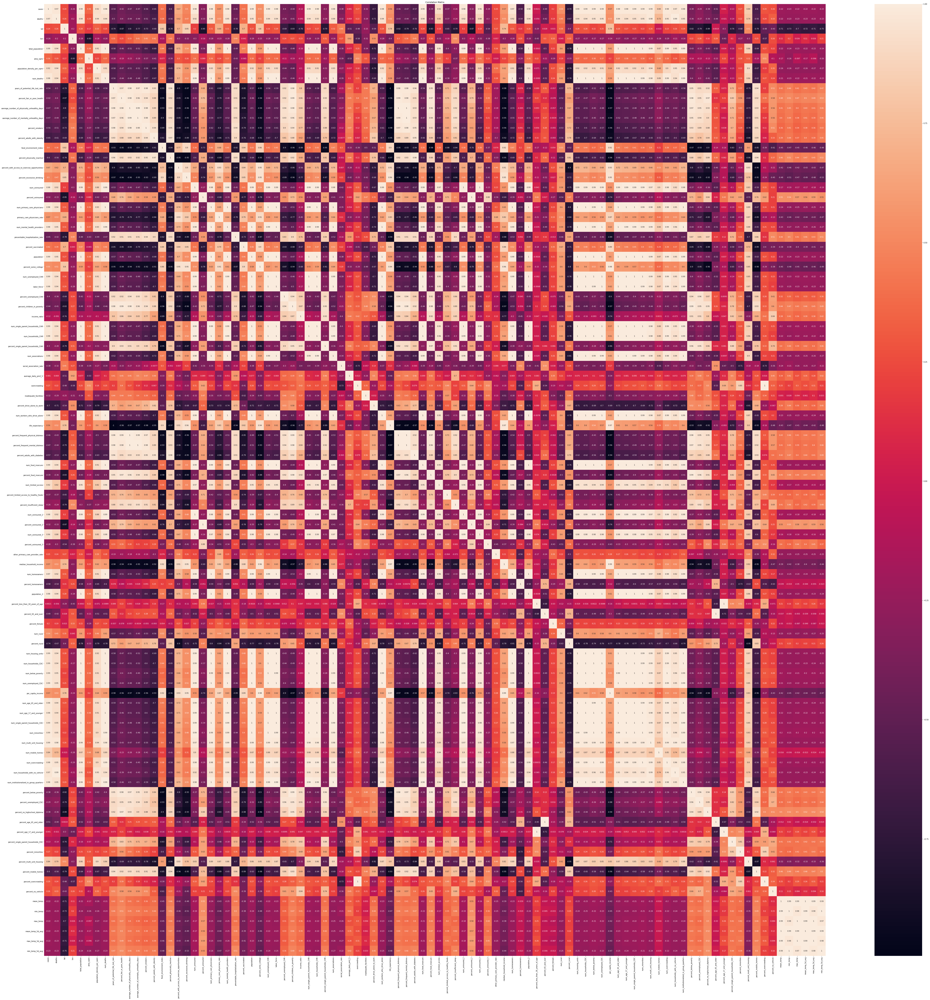

In [38]:
f, ax = plt.subplots(figsize=(100, 100))
cmh = sns.heatmap(C19usaCP.corr(), annot=True) #cmh -> correlation matrix heatmap
plt.title('Correlation Matrix')
print(cmh)

Here it is difficult to look out that which column is correlated to each other so we define code to find out 0.90 above value between 2 columns 

In [39]:
cor_pairs = []
for i in range(len(C19usaCP.columns)):
    for j in range(i + 1, len(C19usaCP.columns)):
        if abs(C19usaCP.iloc[i, j]) > 0.9:
            cor_pairs.append((C19usaCP.columns[i], C19usaCP.columns[j]))

In [40]:
print(cor_pairs)

[('total_population', 'num_deaths'), ('total_population', 'num_uninsured'), ('total_population', 'num_primary_care_physicians'), ('total_population', 'num_mental_health_providers'), ('total_population', 'population'), ('total_population', 'num_unemployed_CHR'), ('total_population', 'labor_force'), ('total_population', 'num_single_parent_households_CHR'), ('total_population', 'num_households_CHR'), ('total_population', 'num_associations'), ('total_population', 'num_workers_who_drive_alone'), ('total_population', 'num_food_insecure'), ('total_population', 'num_uninsured_2'), ('total_population', 'num_homeowners'), ('total_population', 'population_2'), ('total_population', 'num_housing_units'), ('total_population', 'num_households_CDC'), ('total_population', 'num_below_poverty'), ('total_population', 'num_unemployed_CDC'), ('total_population', 'num_age_65_and_older'), ('total_population', 'num_age_17_and_younger'), ('total_population', 'num_single_parent_households_CDC'), ('total_populati

In [41]:
type(cor_pairs)
len(cor_pairs)

306

In [42]:
!pip install tabulate

In [43]:
from tabulate import tabulate
print(tabulate(cor_pairs))

-------------------------------------------  -----------------------------------------
total_population                             num_deaths
total_population                             num_uninsured
total_population                             num_primary_care_physicians
total_population                             num_mental_health_providers
total_population                             population
total_population                             num_unemployed_CHR
total_population                             labor_force
total_population                             num_single_parent_households_CHR
total_population                             num_households_CHR
total_population                             num_associations
total_population                             num_workers_who_drive_alone
total_population                             num_food_insecure
total_population                             num_uninsured_2
total_population                             num_homeowners
total_populati

In [44]:
C19usaV1.drop(['stay_at_home_announced','total_population','labor_force','num_workers_who_drive_alone',
             'num_associations','num_uninsured_2', 'num_uninsured_3', 'population_2', 'num_single_parent_households_CDC',
               'percent_single_parent_households_CHR','social_association_rate','percent_no_highschool_diploma',
               'num_homeowners','num_housing_units','num_households_CDC','num_below_poverty','num_age_65_and_older',
               'num_age_17_and_younger',
             'num_minorities', 'years_of_potential_life_lost_rate', 'percent_frequent_physical_distress',
             'average_number_of_mentally_unhealthy_days','num_single_parent_households_CHR',
             'overcrowding', 'num_institutionalized_in_group_quarters','num_unemployed_CDC','mean_temp',
               'max_temp_5d_avg','min_temp_5d_avg','fips','lat','lon' ], inplace = True, axis =1)

In [45]:
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 640657 entries, 0 to 783890
Data columns (total 70 columns):
 #   Column                                         Non-Null Count   Dtype  
---  ------                                         --------------   -----  
 0   date                                           640657 non-null  object 
 1   county                                         640657 non-null  object 
 2   state                                          640657 non-null  object 
 3   cases                                          640657 non-null  int64  
 4   deaths                                         640657 non-null  float64
 5   stay_at_home_effective                         640657 non-null  object 
 6   area_sqmi                                      640657 non-null  float64
 7   population_density_per_sqmi                    640657 non-null  float64
 8   num_deaths                                     640657 non-null  float64
 9   percent_fair_or_poor_health          

In [46]:
C19usaCP3 = C19usaV1.corr(method='pearson')
cor_pairs_3 = []
for i in range(len(C19usaCP3.columns)):
    for j in range(i + 1, len(C19usaCP3.columns)):
        if abs(C19usaCP3.iloc[i, j]) > 0.9:
            cor_pairs_3.append((C19usaCP3.columns[i], C19usaCP3.columns[j]))
            
print(cor_pairs_3)
len(cor_pairs_3)

[('num_deaths', 'num_uninsured'), ('num_deaths', 'num_primary_care_physicians'), ('num_deaths', 'population'), ('num_deaths', 'num_unemployed_CHR'), ('num_deaths', 'num_households_CHR'), ('num_deaths', 'num_food_insecure'), ('average_number_of_physically_unhealthy_days', 'percent_frequent_mental_distress'), ('num_uninsured', 'population'), ('num_uninsured', 'num_unemployed_CHR'), ('num_uninsured', 'num_households_CHR'), ('num_uninsured', 'num_food_insecure'), ('percent_uninsured', 'percent_uninsured_2'), ('num_primary_care_physicians', 'num_mental_health_providers'), ('num_primary_care_physicians', 'population'), ('num_primary_care_physicians', 'num_unemployed_CHR'), ('num_primary_care_physicians', 'num_households_CHR'), ('num_primary_care_physicians', 'num_food_insecure'), ('num_mental_health_providers', 'population'), ('num_mental_health_providers', 'num_unemployed_CHR'), ('num_mental_health_providers', 'num_households_CHR'), ('population', 'num_unemployed_CHR'), ('population', 'num_

33

In [47]:
print(tabulate(cor_pairs_3))

-------------------------------------------  --------------------------------
num_deaths                                   num_uninsured
num_deaths                                   num_primary_care_physicians
num_deaths                                   population
num_deaths                                   num_unemployed_CHR
num_deaths                                   num_households_CHR
num_deaths                                   num_food_insecure
average_number_of_physically_unhealthy_days  percent_frequent_mental_distress
num_uninsured                                population
num_uninsured                                num_unemployed_CHR
num_uninsured                                num_households_CHR
num_uninsured                                num_food_insecure
percent_uninsured                            percent_uninsured_2
num_primary_care_physicians                  num_mental_health_providers
num_primary_care_physicians                  population
num_primary_care_physici

Removed column from above pairs from correlations.....

In [48]:
C19usaV1.drop(['num_uninsured','num_primary_care_physicians','num_households_CHR','num_unemployed_CHR','average_number_of_physically_unhealthy_days',
               'percent_uninsured_2','num_primary_care_physicians','percent_age_65_and_older','percent_age_17_and_younger',
               'mean_temp_5d_avg','mean_temp_5d_avg'],inplace=True, axis=1)
C19usaV1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 640657 entries, 0 to 783890
Data columns (total 61 columns):
 #   Column                                         Non-Null Count   Dtype  
---  ------                                         --------------   -----  
 0   date                                           640657 non-null  object 
 1   county                                         640657 non-null  object 
 2   state                                          640657 non-null  object 
 3   cases                                          640657 non-null  int64  
 4   deaths                                         640657 non-null  float64
 5   stay_at_home_effective                         640657 non-null  object 
 6   area_sqmi                                      640657 non-null  float64
 7   population_density_per_sqmi                    640657 non-null  float64
 8   num_deaths                                     640657 non-null  float64
 9   percent_fair_or_poor_health          

In [49]:
df = C19usaV1 
df.head(5)

,date,county,state,cases,deaths,stay_at_home_effective,area_sqmi,population_density_per_sqmi,num_deaths,percent_fair_or_poor_health,...,percent_below_poverty,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,min_temp,max_temp
0,2020-01-21,Snohomish,Washington,1,0.0,no,2086.572826,363.586159,7592.0,14.403971,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,37.0,50.0
1,2020-01-22,Snohomish,Washington,1,0.0,no,2086.572826,363.586159,7592.0,14.403971,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,37.9,48.0
2,2020-01-23,Snohomish,Washington,1,0.0,no,2086.572826,363.586159,7592.0,14.403971,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,42.8,54.0
3,2020-01-24,Cook,Illinois,1,0.0,no,944.990922,5531.878539,57660.0,17.140851,...,16.7,9.7,9.3,57.1,23.0,0.7,3.6,17.8,34.0,39.0
4,2020-01-24,Snohomish,Washington,1,0.0,no,2086.572826,363.586159,7592.0,14.403971,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,48.0,54.0


In [59]:
temp = df.sort_values(['cases'],ascending=False).groupby(["state","county"])["deaths","cases"].sum()
temp = temp.reset_index(level=['state', 'county'])
temp1 = temp[["state","county","cases","deaths"]]
temp1

<ipython-input-59-fd458c3f9b9a>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  temp = df.sort_values(['cases'],ascending=False).groupby(["state","county"])["deaths","cases"].sum()


,state,county,cases,deaths
0,Alabama,Autauga,256479,4244.0
1,Alabama,Baldwin,511752,5045.0
2,Alabama,Barbour,112648,917.0
3,Alabama,Bibb,98826,1409.0
4,Alabama,Blount,225201,2225.0
5,Alabama,Bullock,91639,2422.0
6,Alabama,Butler,157037,6626.0
7,Alabama,Calhoun,475614,6409.0
8,Alabama,Chambers,195708,7782.0
9,Alabama,Cherokee,79580,2017.0


In [54]:
temp_val = temp1.groupby('state')['cases'].sum().nlargest(5)
top_states = [(state, count) for state, count in temp_val.to_dict().items()]
first_elements = [pair[0] for pair in top_states]

selected_temp1 = temp1[temp1['state'].isin(first_elements)]
selected_temp1.shape

(449, 4)

Top 5 Countries population covid cases and population

In [61]:
selected_temp1

,state,county,cases,deaths
149,California,Alameda,3012776,56504.0
150,California,Amador,36856,1646.0
151,California,Butte,332771,4694.0
152,California,Calaveras,21293,477.0
153,California,Colusa,67467,711.0
154,California,Contra Costa,2240609,30875.0
155,California,Del Norte,22886,103.0
156,California,El Dorado,157773,384.0
157,California,Fresno,3765791,47900.0
158,California,Glenn,76395,419.0


Top 5 state of covid cases 

In [64]:
import plotly.express as px
import numpy as np
fig = px.icicle(selected_temp1, path=[px.Constant("United States"), 'state', 'county'], values='cases',
                  color='state', hover_data=['county'],
                  color_continuous_scale='RdBu',
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [65]:
temp_val2 = temp1.groupby('state')['cases'].sum().nsmallest(5)
top_states2 = [(state, count) for state, count in temp_val2.to_dict().items()]
first_elements = [pair[0] for pair in top_states2]
selected_temp2 = temp1[temp1['state'].isin(first_elements)]
selected_temp2.shape

(117, 4)

Bottom 5 Countries population covid cases and population

In [67]:
fig = px.icicle(selected_temp2, path=[px.Constant("United States"), 'state', 'county'], values='cases',
                  color='state', hover_data=['cases'],
                  color_continuous_scale='RdBu',
                 )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

All states of cases...

In [69]:
import plotly.express as px
import numpy as np
fig = px.icicle(df, path=[px.Constant("United States"), 'state', 'county'], values='cases',
                  color='state', hover_data=['area_sqmi'],
                  color_continuous_scale='RdBu',
                 )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [ ]:
fig = px.scatter_mapbox(C19usa, lat="lat", lon="lon",  hover_name="state",size="cases", hover_data=["county", "cases","area_sqmi", "num_deaths"],
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=2.8)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
temp = df.sort_values(['cases'],ascending=False).groupby(["state","county"])["cases","deaths"].sum()
temp = temp.reset_index(level=["state","county"])
temp

In [ ]:
import plotly.graph_objects as go
fig = go.Figure()
col_nam = "state"
fig.add_trace(go.Scatter(x=df['state'], y=df['deaths'],
                    mode='lines+markers',
                    name=col_nam,
                    line=dict(color='firebrick', width=5, dash='dash'))
                    )

fig.add_trace(go.Bar(x=df['state'], y=df["deaths"],
                    name=col_nam))

fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='black',
                  marker_line_width=3, opacity=0.8)

fig.show()

In [3]:
import pandas as pd
import numpy as np

import random
import os
import math
import joblib

from sklearn.model_selection import StratifiedKFold
from sklearn.datasets import load_diabetes
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn import neighbors
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

In [ ]:
# Take csv file of remaining 60 columns.

In [4]:
df = pd.read_csv("covid-19_data60.csv")

In [3]:
df

,sn,date,county,state,cases,deaths,stay_at_home_effective,area_sqmi,population_density_per_sqmi,num_deaths,...,percent_below_poverty,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,min_temp,max_temp
0,0,21-01-2020,Snohomish,Washington,1,0,0,2086.572826,363.586159,7592,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,37.0,50.0
1,1,22-01-2020,Snohomish,Washington,1,0,0,2086.572826,363.586159,7592,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,37.9,48.0
2,2,23-01-2020,Snohomish,Washington,1,0,0,2086.572826,363.586159,7592,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,42.8,54.0
3,3,24-01-2020,Cook,Illinois,1,0,0,944.990922,5531.878539,57660,...,16.7,9.7,9.3,57.1,23.0,0.7,3.6,17.8,34.0,39.0
4,4,24-01-2020,Snohomish,Washington,1,0,0,2086.572826,363.586159,7592,...,9.3,6.2,8.2,28.0,14.6,5.3,2.9,5.0,48.0,54.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640652,783886,02-12-2020,Sweetwater,Wyoming,1934,6,0,10426.722050,4.297803,532,...,11.0,5.1,9.9,20.2,6.0,22.4,2.9,3.1,8.1,30.9
640653,783887,02-12-2020,Teton,Wyoming,1678,2,0,3995.936355,5.661502,109,...,7.3,2.1,6.1,18.8,6.6,3.0,3.7,1.7,-4.5,26.2
640654,783888,02-12-2020,Uinta,Wyoming,1121,4,0,2081.827988,10.035892,256,...,16.8,6.4,9.1,12.3,6.2,24.6,3.4,3.5,12.0,30.9
640655,783889,02-12-2020,Washakie,Wyoming,486,8,0,2238.550443,3.730539,110,...,14.7,7.4,7.4,17.6,1.8,11.3,2.1,6.4,8.1,39.0


In [5]:
#remove column which is county, state 
df1 = df.iloc[:, 4:]
# fit and transform the dataframe
# df_scaled = scaler.fit_transform(df1)

# # convert the scaled data back to a pandas dataframe
# df_scaled = pd.DataFrame(df_scaled, columns=df1.columns)

In [6]:
df1.columns

Index(['cases', 'deaths', 'stay_at_home_effective', 'area_sqmi',
       'population_density_per_sqmi', 'num_deaths',
       'percent_fair_or_poor_health', 'percent_smokers',
       'percent_adults_with_obesity', 'food_environment_index',
       'percent_physically_inactive',
       'percent_with_access_to_exercise_opportunities',
       'percent_excessive_drinking', 'percent_uninsured',
       'primary_care_physicians_rate', 'num_mental_health_providers',
       'preventable_hospitalization_rate', 'percent_vaccinated', 'population',
       'percent_some_college', 'percent_unemployed_CHR',
       'percent_children_in_poverty', 'income_ratio', 'average_daily_pm2_5',
       'inadequate_facilities', 'percent_drive_alone_to_work',
       'life_expectancy', 'percent_frequent_mental_distress',
       'percent_adults_with_diabetes', 'num_food_insecure',
       'percent_food_insecure', 'num_limited_access',
       'percent_limited_access_to_healthy_foods', 'percent_insufficient_sleep',
       '

In [6]:
# Implementing Feature selection here to pick best features for dataset with forward selection technique

In [7]:
# df_scaled.head()

In [8]:
# df2 = df.iloc[:,4]
# df = pd.concat([df2,df_scaled],axis =1)
# df.head()

In [7]:
# declare Initial class for declaring function argumnets value.
class Configurations:
    Num_Fold = 6
    Train_Fold = 4
    Seed = 42
    Fold_Type = 'STRATIFIED'
    Shuffle = True
    SAVE_MODEL = True
    Models = {
        'LinearRegression': LinearRegression(),
        'RidgeRegression': Ridge(alpha = 1.0),
        'LassoRegression': Lasso(alpha =1.0),
        'GradientBoostingRegressor': GradientBoostingRegressor(n_estimators = 200, max_depth = 1),
        'KNN': KNeighborsRegressor(n_neighbors=3)
       
    }
    


In [8]:
# Create Fold Function:
def create_folds(data, num_folds = Configurations.Num_Fold):
  
    data = data.sample(frac=1).reset_index(drop=True)
    num_bins = int(np.floor(1 + np.log2(len(data))))

    data.loc[:, "bins"] = pd.cut(
    data["cases"], bins=num_bins, labels=False
    )
    if Configurations.Fold_Type == 'STRATIFIED':
        kf = StratifiedKFold(n_splits=num_folds, random_state=Configurations.Seed, shuffle=Configurations.Shuffle)
  
    for f, (t_, v_) in enumerate(kf.split(X=data, y=data.bins.values)):
        data.loc[v_, 'kfold'] = f

    data = data.drop("bins", axis=1)
    return data 

In [9]:
# Assigning fold number in df1 dataframe
df1 = create_folds(df1)
df1.kfold.value_counts()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=6.
  warnings.warn(


0.0    106777
5.0    106776
4.0    106776
1.0    106776
3.0    106776
2.0    106776
Name: kfold, dtype: int64

In [10]:
df1

,cases,deaths,stay_at_home_effective,area_sqmi,population_density_per_sqmi,num_deaths,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,food_environment_index,...,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_multi_unit_housing,percent_mobile_homes,percent_overcrowding,percent_no_vehicle,min_temp,max_temp,kfold
0,72,1,0,1069.289196,116.510108,1661,22.013635,19.534762,32.2,6.1,...,9.0,12.7,42.8,7.5,5.0,2.1,7.0,49.5,83.3,5.0
1,22,1,0,1058.490494,59.028400,925,18.495676,17.391719,36.2,7.6,...,4.9,9.2,23.5,5.1,4.1,3.3,4.1,60.8,86.0,0.0
2,1,0,1,499.452768,45.123386,566,25.973087,24.145530,36.1,7.6,...,12.1,8.8,2.5,0.9,25.9,2.1,11.2,28.9,53.1,2.0
3,52,2,1,499.452768,45.123386,566,25.973087,24.145530,36.1,7.6,...,12.1,8.8,2.5,0.9,25.9,2.1,11.2,57.9,78.1,0.0
4,787,50,1,508.263247,84.320478,573,14.440926,15.691013,33.1,8.9,...,5.5,7.6,11.1,5.0,4.6,2.0,5.2,60.8,69.8,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640652,18552,305,1,1704.857157,2600.955149,44526,18.852602,13.852122,27.7,7.1,...,7.0,11.6,68.8,26.0,2.5,5.7,6.4,68.0,93.9,1.0
640653,207,4,1,284.036195,39.611149,239,20.004145,19.378871,37.4,7.6,...,5.3,9.9,25.9,0.6,35.7,2.3,5.3,69.1,93.0,2.0
640654,1906,17,1,435.743380,88.265254,421,11.107882,14.765430,34.0,9.0,...,6.1,8.2,5.6,7.4,3.2,1.8,3.5,28.4,42.8,3.0
640655,28,0,1,1624.566214,3.795475,88,16.823442,18.985571,34.9,6.3,...,8.5,10.4,19.0,4.1,12.2,3.1,5.6,42.1,59.0,1.0


In [ ]:
# This is for feature engineering 

In [13]:
!pip install --upgrade scikit-learn

  Attempting uninstall: joblib
    Found existing installation: joblib 0.16.0
    Uninstalling joblib-0.16.0:
      Successfully uninstalled joblib-0.16.0
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.23.1
    Uninstalling scikit-learn-0.23.1:
      Successfully uninstalled scikit-learn-0.23.1


In [14]:
# This is the line which help mlxtend to run in google colab. please run this one ###############################............
%pip install mlxtend --upgrade

  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.18.0
    Uninstalling mlxtend-0.18.0:
      Successfully uninstalled mlxtend-0.18.0
Note: you may need to restart the kernel to use updated packages.


In [10]:
# If you want to execute mlxtend package then you have to run previous 2 cells and restart runtime from runtime 
from sklearn.feature_selection import SequentialFeatureSelector
from mlxtend.feature_selection import SequentialFeatureSelector

In [28]:
#We used Linear regression model to pick best predictors to train model we could not select KNN because its computing time is too high.
forward_feature_selection = SequentialFeatureSelector(LinearRegression(), k_features = (1,56), forward = True,
                                                     floating = False, verbose = 2, scoring='neg_mean_squared_error',
                                                      cv=5).fit(X,y)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  56 out of  56 | elapsed:   15.8s finished

[2023-03-31 17:18:50] Features: 1/56 -- score: -30252981.317428447[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:   29.7s finished

[2023-03-31 17:19:20] Features: 2/56 -- score: -21915087.258609224[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  54 out of  54 | elapsed:   36.2s finished

[2023-03-31 17:19:56] Features: 3/56 -- score: -20883891.26847778[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done

[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:  2.4min finished

[2023-03-31 18:05:21] Features: 28/56 -- score: -17439076.413425293[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:  2.6min finished

[2023-03-31 18:07:59] Features: 29/56 -- score: -17438047.051105242[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:  2.5min finished

[2023-03-31 18:10:29] Features: 30/56 -- score: -17436721.173704065[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:  2.3min finished

[2023-03-31 18:12:49] Features: 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   10.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   10.1s finished

[2023-03-31 18:51:43] Features: 56/56 -- score: -17426407.23338611

In [16]:
X = df1.iloc[:,1:-1 ]
y = df1.iloc[:,0]

In [17]:
X.shape

(640657, 56)

In [11]:
xy = list(forward_feature_selection.k_feature_names_)
len(xy)

40

In [32]:
forward_feature_selection.k_score_

-17425161.49177202

In [24]:
pd.DataFrame.from_dict(forward_feature_selection.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(0,)","[-29717464.66744507, -28118724.468032554, -327...",-3.0253e+07,"(deaths,)",1.92171e+06,1.49515e+06,747577
2,"(0, 4)","[-21147439.155689895, -20180587.85593527, -236...",-2.19151e+07,"(deaths, num_deaths)",1.52757e+06,1.1885e+06,594251
3,"(0, 4, 43)","[-20249194.66060214, -19358204.858571853, -224...",-2.08839e+07,"(deaths, num_deaths, num_multi_unit_housing)",1.34408e+06,1.04574e+06,522870
4,"(0, 4, 17, 43)","[-18546645.682057306, -17969484.038909234, -20...",-1.9351e+07,"(deaths, num_deaths, population, num_multi_uni...",1.22787e+06,955322,477661
5,"(0, 4, 14, 17, 43)","[-17760867.01455314, -17381018.82048342, -1986...",-1.85868e+07,"(deaths, num_deaths, num_mental_health_provide...",1.16783e+06,908613,454307


In [ ]:
#This one is final dataframe after feature selection engineering.
'''l1 = ['cases','deaths','stay_at_home_effective','population_density_per_sqmi','num_deaths','percent_fair_or_poor_health','percent_smokers',
 'percent_adults_with_obesity','food_environment_index','percent_physically_inactive','percent_with_access_to_exercise_opportunities','percent_excessive_drinking',
 'percent_uninsured','num_mental_health_providers','preventable_hospitalization_rate','percent_vaccinated',
 'population','percent_some_college','percent_unemployed_CHR','percent_children_in_poverty','average_daily_pm2_5',
 'inadequate_facilities','percent_drive_alone_to_work','life_expectancy','percent_frequent_mental_distress',
 'percent_adults_with_diabetes','num_food_insecure','percent_food_insecure','percent_limited_access_to_healthy_foods',
 'percent_insufficient_sleep','percent_uninsured_3','other_primary_care_provider_rate','median_household_income',
 'percent_homeowners','percent_less_than_18_years_of_age','percent_65_and_over','percent_female',
 'num_rural','percent_rural','num_multi_unit_housing','num_overcrowding','percent_below_poverty',
 'percent_unemployed_CDC','percent_single_parent_households_CDC','percent_minorities','percent_multi_unit_housing',
 'percent_mobile_homes','percent_overcrowding','percent_no_vehicle','min_temp','max_temp','kfold']'''

In [11]:
l1 = ['cases','deaths','stay_at_home_effective','population_density_per_sqmi','percent_fair_or_poor_health','percent_smokers',
 'percent_adults_with_obesity','percent_physically_inactive','percent_with_access_to_exercise_opportunities',
 'percent_uninsured','preventable_hospitalization_rate','percent_vaccinated',
 'population','percent_unemployed_CHR','percent_children_in_poverty','average_daily_pm2_5',
 'inadequate_facilities','life_expectancy',
 'percent_adults_with_diabetes','num_food_insecure','percent_food_insecure','percent_limited_access_to_healthy_foods',
 'percent_insufficient_sleep','other_primary_care_provider_rate','median_household_income',
 'percent_homeowners','percent_less_than_18_years_of_age','percent_65_and_over','percent_female',
 'percent_rural','num_multi_unit_housing','num_overcrowding','percent_below_poverty',
 'percent_unemployed_CDC','percent_single_parent_households_CDC','percent_minorities','percent_no_vehicle','min_temp','max_temp','kfold']

df1 = df1[l1]
df1

,cases,deaths,stay_at_home_effective,population_density_per_sqmi,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_uninsured,...,num_multi_unit_housing,num_overcrowding,percent_below_poverty,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_no_vehicle,min_temp,max_temp,kfold
0,72,1,0,116.510108,22.013635,19.534762,32.2,29.6,68.682009,14.958271,...,3860,886,16.8,9.0,12.7,42.8,7.0,49.5,83.3,5.0
1,22,1,0,59.028400,18.495676,17.391719,36.2,28.6,66.761307,18.021956,...,1372,793,13.1,4.9,9.2,23.5,4.1,60.8,86.0,0.0
2,1,0,1,45.123386,25.973087,24.145530,36.1,41.0,61.657421,7.739053,...,102,195,20.1,12.1,8.8,2.5,11.2,28.9,53.1,2.0
3,52,2,1,45.123386,25.973087,24.145530,36.1,41.0,61.657421,7.739053,...,102,195,20.1,12.1,8.8,2.5,11.2,57.9,78.1,0.0
4,787,50,1,84.320478,14.440926,15.691013,33.1,26.9,63.648703,12.210713,...,1057,342,10.6,5.5,7.6,11.1,5.2,60.8,69.8,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640652,18552,305,1,2600.955149,18.852602,13.852122,27.7,22.7,90.566210,22.060025,...,438774,86997,17.4,7.0,11.6,68.8,6.4,68.0,93.9,1.0
640653,207,4,1,39.611149,20.004145,19.378871,37.4,34.4,60.724585,19.383212,...,29,90,18.3,5.3,9.9,25.9,5.3,69.1,93.0,2.0
640654,1906,17,1,88.265254,11.107882,14.765430,34.0,26.6,40.070341,4.774656,...,1149,258,7.2,6.1,8.2,5.6,3.5,28.4,42.8,3.0
640655,28,0,1,3.795475,16.823442,18.985571,34.9,23.8,48.545425,13.574177,...,108,69,20.2,8.5,10.4,19.0,5.6,42.1,59.0,1.0


In [13]:
df1.describe()

,cases,deaths,stay_at_home_effective,population_density_per_sqmi,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_uninsured,...,num_multi_unit_housing,num_overcrowding,percent_below_poverty,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_no_vehicle,min_temp,max_temp,kfold
count,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,...,6.406570e+05,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000,640657.000000
mean,1804.890914,55.988723,0.819888,266.113857,18.006812,17.585811,33.052461,27.305518,65.847029,10.925207,...,7.339176e+03,1611.479367,16.550146,7.300566,8.821281,23.068875,6.575052,53.465870,76.668247,2.499996
std,8868.325859,478.488315,0.384281,1027.507292,4.573195,3.473435,5.384127,5.838633,20.969780,4.857441,...,4.989377e+04,11400.715093,6.267286,2.889478,2.410710,19.185902,3.197249,14.878914,14.593810,1.707828
min,1.000000,0.000000,0.000000,0.484794,8.120645,5.908719,12.400000,9.500000,0.000000,2.262724,...,0.000000e+00,0.000000,3.700000,0.300000,2.300000,0.400000,0.500000,-26.000000,2.500000,0.000000
25%,41.000000,0.000000,1.000000,27.616575,14.528619,15.142635,29.600000,23.400000,52.419530,7.086112,...,1.620000e+02,123.000000,12.100000,5.300000,7.200000,7.600000,4.600000,42.800000,68.000000,1.000000
50%,233.000000,4.000000,1.000000,59.916511,17.372703,17.268686,33.300000,27.200000,68.359843,9.979250,...,4.940000e+02,280.000000,15.900000,7.000000,8.600000,16.300000,6.000000,55.000000,79.900000,2.000000
75%,947.000000,22.000000,1.000000,159.732328,20.924156,19.872211,36.600000,31.200000,81.664080,13.716410,...,2.289000e+03,720.000000,19.900000,8.800000,10.200000,34.600000,7.800000,66.000000,87.800000,4.000000
max,387793.000000,24287.000000,1.000000,28069.675980,40.990687,41.491309,57.700000,49.900000,100.000000,33.749600,...,1.852295e+06,386393.000000,48.700000,26.100000,25.500000,99.200000,53.350740,100.900000,123.300000,5.000000


In [14]:
df1.shape

(640657, 40)

In [38]:
summary = df1.describe()

In [39]:
mean = summary.loc['mean']
maxv = summary.loc['max']

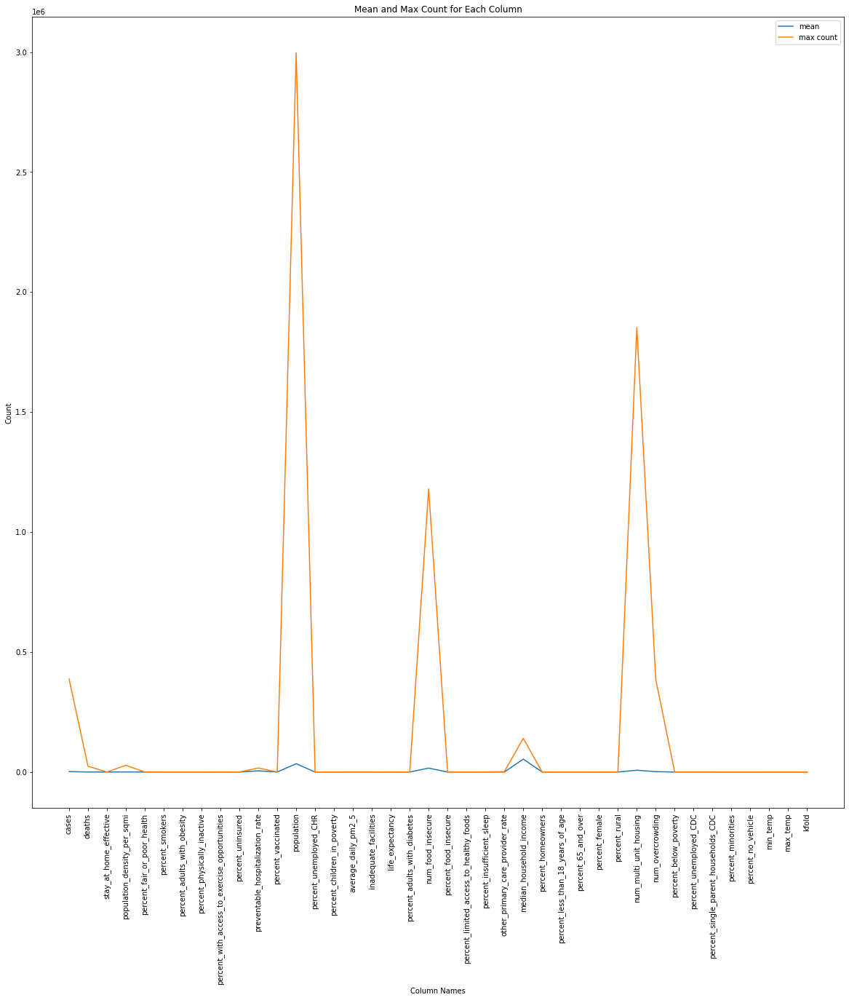

In [40]:
# comparing mean max value of all predictors
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 20))
plt.plot(mean.index, mean.values, label='mean')
plt.plot(maxv.index, maxv.values, label='max count')
plt.legend()
plt.xlabel('Column Names')
plt.ylabel('Count')
plt.title('Mean and Max Count for Each Column')
plt.xticks(rotation=90)
plt.show()

In [12]:
#We take 70% data for training and validation in df2.
Tdf = df1[df1['kfold'] <= 3]
Vdf = df1[df1['kfold'] > 3]    



In [ ]:
# Function for Train and validate folds sequentialy:

In [15]:
def run_folds(df, model_name, model, fold = 0):

    trainset = df[df['kfold'] != fold]
    validset = df[df['kfold'] == fold]

    X_train, Y_train = trainset.iloc[:, 1:-1], trainset.iloc[:, 0]
    X_valid, Y_valid = validset.iloc[:, 1:-1], validset.iloc[:, 0]

    model.fit(X_train, Y_train)
    y_train_pred = model.predict(X_train)
    y_valid_pred = model.predict(X_valid)

    train_rmse_score = np.sqrt(mean_squared_error(Y_train, y_train_pred))
    train_R2_score = r2_score(Y_train, y_train_pred)
    valid_rmse_score = np.sqrt(mean_squared_error(Y_valid, y_valid_pred))
    valid_R2_score = r2_score(Y_valid, y_valid_pred)

    print(f'MODEL : {model_name} FOLD : {fold} TRAIN_SCORE : {train_rmse_score} TRAIN_R2_SCORE : {train_R2_score} VALID_SCORE : {valid_rmse_score} VALID_R2_SCORE : {valid_R2_score}' )

    

    if Configurations.SAVE_MODEL == True:
        joblib.dump(model, 'STD_Covid-19 '+ str(fold) + '_' +model_name+'.pkl')

    return train_rmse_score, valid_rmse_score, train_R2_score, valid_R2_score

In [16]:
temp = {}
for model_name, model in Configurations.Models.items():
    train_scores = []
    tR2_score = []
    vR2_score = []
    valid_scores = []
    for i in range(Configurations.Train_Fold):
        train_rmse_score,valid_rmse_score, train_R2_score, valid_R2_score = run_folds(Tdf,model_name,model,fold=i)
        train_scores.append(train_rmse_score)
        tR2_score.append(train_R2_score)
        valid_scores.append(valid_rmse_score)
        vR2_score.append(valid_R2_score)
    print('\n')
    temp[model_name +'Train'] = train_scores
    temp[model_name + 'T_R2'] = tR2_score
    temp[model_name + 'valid'] = valid_scores
    temp[model_name + 'V_R2'] = vR2_score
    

temp_df = pd.DataFrame(temp)

MODEL : LinearRegression FOLD : 0 TRAIN_SCORE : 4256.281248652231 TRAIN_R2_SCORE : 0.7689334929460878 VALID_SCORE : 4395.834158810979 VALID_R2_SCORE : 0.7566739652016329
MODEL : LinearRegression FOLD : 1 TRAIN_SCORE : 4293.944259866788 TRAIN_R2_SCORE : 0.7656282494742657 VALID_SCORE : 4280.260272922062 VALID_R2_SCORE : 0.7669381052084294
MODEL : LinearRegression FOLD : 2 TRAIN_SCORE : 4292.387682664008 TRAIN_R2_SCORE : 0.7658695250989116 VALID_SCORE : 4285.2419005596985 VALID_R2_SCORE : 0.7661812637271548
MODEL : LinearRegression FOLD : 3 TRAIN_SCORE : 4315.238542307799 TRAIN_R2_SCORE : 0.7638474729314666 VALID_SCORE : 4221.457136012941 VALID_R2_SCORE : 0.7717027716054528


MODEL : RidgeRegression FOLD : 0 TRAIN_SCORE : 4256.281248653386 TRAIN_R2_SCORE : 0.7689334929459626 VALID_SCORE : 4395.834155936318 VALID_R2_SCORE : 0.7566739655198795
MODEL : RidgeRegression FOLD : 1 TRAIN_SCORE : 4293.944259867911 TRAIN_R2_SCORE : 0.7656282494741431 VALID_SCORE : 4280.260276769423 VALID_R2_SCORE 

In [43]:
# Store result in dataframe of all model score.
msdf = pd.DataFrame(temp_df)
msdf

,LinearRegressionTrain,LinearRegressionT_R2,LinearRegressionvalid,LinearRegressionV_R2,RidgeRegressionTrain,RidgeRegressionT_R2,RidgeRegressionvalid,RidgeRegressionV_R2,LassoRegressionTrain,LassoRegressionT_R2,LassoRegressionvalid,LassoRegressionV_R2,GradientBoostingRegressorTrain,GradientBoostingRegressorT_R2,GradientBoostingRegressorvalid,GradientBoostingRegressorV_R2,KNNTrain,KNNT_R2,KNNvalid,KNNV_R2
0,4288.841192,0.765374,4326.556394,0.763370,4288.841192,0.765374,4326.556391,0.763370,4288.843212,0.765374,4326.562033,0.763369,3051.257860,0.881245,3152.611129,0.874361,180.988462,0.999582,275.662267,0.999039
1,4294.266408,0.764979,4309.054821,0.764687,4294.266408,0.764979,4309.054808,0.764687,4294.268400,0.764979,4309.028414,0.764690,3077.305191,0.879311,3065.780703,0.880886,183.459407,0.999571,293.436095,0.998909
2,4298.732699,0.764947,4296.620364,0.764679,4298.732699,0.764947,4296.620356,0.764679,4298.734723,0.764947,4296.609528,0.764680,3081.438734,0.879221,3082.902328,0.878849,182.122987,0.999578,285.113576,0.998964
3,4307.496960,0.764601,4269.500173,0.765806,4307.496960,0.764601,4269.500194,0.765806,4307.498980,0.764601,4269.529241,0.765803,3057.951456,0.881364,3132.012330,0.873972,181.408842,0.999582,267.569464,0.999080


In [44]:
# Download model result csv file for further use
msdf.to_csv('Model_result.csv', index = False)

In [28]:
pip install scikit-learn==0.22.2.post1

Note: you may need to restart the kernel to use updated packages.Collecting scikit-learn==0.22.2.post1


ERROR: mlxtend 0.22.0 has requirement scikit-learn>=1.0.2, but you'll have scikit-learn 0.22.2.post1 which is incompatible.
ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\Lib\\site-packages\\~klearn\\.libs\\msvcp140.dll'
Consider using the `--user` option or check the permissions.




  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2


In [33]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.Collecting scikit-learn
  Using cached scikit_learn-1.2.2-cp38-cp38-win_amd64.whl (8.3 MB)



ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\Lib\\site-packages\\~-learn\\neighbors\\_dist_metrics.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1


In [13]:
# this is for take model file for apply model on testing data
load_model = {}

for i in range(Configurations.Train_Fold):
    load_model['KNN' + str(i)] = joblib.load('STD_Covid-19 '+ str(i) + '_'+ 'KNN' +'.pkl')

In [14]:
load_model

{'KNN0': KNeighborsRegressor(n_neighbors=3),
 'KNN1': KNeighborsRegressor(n_neighbors=3),
 'KNN2': KNeighborsRegressor(n_neighbors=3),
 'KNN3': KNeighborsRegressor(n_neighbors=3)}

In [16]:
# This is code where we use all 3 model which is train and validate on each K-folds range[0-3] and apply test on [4,5] fold dataset
y_prediction = 0
Df3 =Vdf.iloc[:,1:-1] 
for _, model in load_model.items():
     y_prediction += model.predict(Df3)
y_prediction = y_prediction/4

In [ ]:
# We converted predicted response value float to Integer because it is a count numbers of cases and cases can not be in decimal.

In [17]:
y_list = list(y_prediction)
y_list = [int(item) for item in y_list]

In [18]:
#df6 is new dataframe which contain testing dataset of [4,5] folds data and predicted value by model, 
# I removed kfold number column
df6 = Vdf.iloc[:,0:-1]
df6= df6.assign(y_predicted=y_list)
df6.shape

(213552, 40)

In [19]:
#This is final dataframe of testing data fold [4,5] with actual target value and predicted value.
df6

,cases,deaths,stay_at_home_effective,population_density_per_sqmi,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_uninsured,...,num_multi_unit_housing,num_overcrowding,percent_below_poverty,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_no_vehicle,min_temp,max_temp,y_predicted
0,72,1,0,116.510108,22.013635,19.534762,32.2,29.6,68.682009,14.958271,...,3860,886,16.8,9.0,12.7,42.8,7.0,49.5,83.3,83
7,6040,111,1,800.078786,16.472484,18.240215,32.3,24.1,84.166735,6.876058,...,13700,1995,13.6,6.1,9.5,17.3,5.5,53.1,80.1,6346
11,1305,34,1,563.351943,12.914832,12.821386,29.2,18.7,89.570880,10.494039,...,2011,523,7.1,6.3,6.7,35.0,2.7,68.0,90.0,1291
14,9126,184,1,79.133688,34.752486,18.426032,37.8,29.3,87.509988,28.566077,...,7979,10298,32.1,5.9,15.7,96.5,7.3,78.1,102.9,9089
16,29,2,1,59.288241,16.885078,18.771038,34.5,18.4,52.484940,8.386288,...,145,59,8.7,5.3,7.0,4.3,4.1,69.1,93.0,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640626,8,1,1,12.815396,15.432541,15.905568,27.7,21.6,79.588800,13.798894,...,165,288,18.7,6.5,6.9,26.8,3.0,27.0,69.1,10
640630,523,15,1,12.623481,33.025991,23.877682,31.6,30.1,5.001651,17.922374,...,26,20,41.4,13.9,11.7,73.2,20.9,46.6,82.9,565
640631,20,2,0,4.186997,13.808078,14.799182,36.0,29.6,48.761313,11.255051,...,197,56,10.9,2.3,6.5,4.7,5.8,46.0,79.0,29
640633,8,0,1,43.021568,20.950036,14.001674,30.7,22.7,55.217249,19.235083,...,358,519,18.1,6.3,11.3,56.3,4.9,72.3,73.9,10


In [21]:
df6.to_csv("Predicted_result.csv", index = False)

In [46]:
# Result of RMSE & R2 score of testing data.
y_actual = df6.iloc[:,0]
y_predicted = df6.iloc[:,-1] 
RMSE_Test = np.sqrt(mean_squared_error(y_actual, y_predicted))
print('RMSE score for testing data : ' ,RMSE_Test)
R2_score = r2_score(y_actual, y_predicted)
print('R2 score ',R2_score)

RMSE score for testing data :  259.2830769720294
R2 score  0.9991473270769496


In [33]:
#Adjusted R2 Score for KNN model.
Adj_r2 = 1-(1-0.974101400657976)*(106777-1)/(106777-50-1)
Adj_r2

0.9740892674386377

In [22]:
loc = pd.read_csv("location.csv")

In [23]:
loc

,Unnamed: 0,fips,lat,lon
0,0,53061,48.047489,-121.697307
1,1,53061,48.047489,-121.697307
2,2,53061,48.047489,-121.697307
3,3,17031,41.840039,-87.816716
4,4,53061,48.047489,-121.697307
...,...,...,...,...
640652,783886,56037,41.659538,-108.879567
640653,783887,56039,43.934776,-110.589759
640654,783888,56041,41.287648,-110.547639
640655,783889,56043,43.904970,-107.682819


In [24]:
# Line plot for comparing actual response value and predicted value by KNN model.
# Plot 

df_new = df6.join(loc[['fips', 'lat', 'lon']], on=df6.index)
df_new

,cases,deaths,stay_at_home_effective,population_density_per_sqmi,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_uninsured,...,percent_unemployed_CDC,percent_single_parent_households_CDC,percent_minorities,percent_no_vehicle,min_temp,max_temp,y_predicted,fips,lat,lon
0,72,1,0,116.510108,22.013635,19.534762,32.2,29.6,68.682009,14.958271,...,9.0,12.7,42.8,7.0,49.5,83.3,83,53061,48.047489,-121.697307
7,6040,111,1,800.078786,16.472484,18.240215,32.3,24.1,84.166735,6.876058,...,6.1,9.5,17.3,5.5,53.1,80.1,6346,53061,48.047489,-121.697307
11,1305,34,1,563.351943,12.914832,12.821386,29.2,18.7,89.570880,10.494039,...,6.3,6.7,35.0,2.7,68.0,90.0,1291,17031,41.840039,-87.816716
14,9126,184,1,79.133688,34.752486,18.426032,37.8,29.3,87.509988,28.566077,...,5.9,15.7,96.5,7.3,78.1,102.9,9089,06037,34.358922,-118.217049
16,29,2,1,59.288241,16.885078,18.771038,34.5,18.4,52.484940,8.386288,...,5.3,7.0,4.3,4.1,69.1,93.0,31,17031,41.840039,-87.816716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640626,8,1,1,12.815396,15.432541,15.905568,27.7,21.6,79.588800,13.798894,...,6.5,6.9,26.8,3.0,27.0,69.1,10,55121,44.303973,-91.358464
640630,523,15,1,12.623481,33.025991,23.877682,31.6,30.1,5.001651,17.922374,...,13.9,11.7,73.2,20.9,46.6,82.9,565,55129,45.899237,-91.791228
640631,20,2,0,4.186997,13.808078,14.799182,36.0,29.6,48.761313,11.255051,...,2.3,6.5,4.7,5.8,46.0,79.0,29,55131,43.368483,-88.230728
640633,8,0,1,43.021568,20.950036,14.001674,30.7,22.7,55.217249,19.235083,...,6.3,11.3,56.3,4.9,72.3,73.9,10,55135,44.470498,-88.964791


In [25]:
#join state county name 
state = df.iloc[:,1:4]
df_new = df_new.join(state, on=df_new.index)


In [26]:
df_new.head()

,cases,deaths,stay_at_home_effective,population_density_per_sqmi,percent_fair_or_poor_health,percent_smokers,percent_adults_with_obesity,percent_physically_inactive,percent_with_access_to_exercise_opportunities,percent_uninsured,...,percent_no_vehicle,min_temp,max_temp,y_predicted,fips,lat,lon,date,county,state
0,72,1,0,116.510108,22.013635,19.534762,32.2,29.6,68.682009,14.958271,...,7.0,49.5,83.3,83,53061,48.047489,-121.697307,21-01-2020,Snohomish,Washington
7,6040,111,1,800.078786,16.472484,18.240215,32.3,24.1,84.166735,6.876058,...,5.5,53.1,80.1,6346,53061,48.047489,-121.697307,25-01-2020,Snohomish,Washington
11,1305,34,1,563.351943,12.914832,12.821386,29.2,18.7,89.570880,10.494039,...,2.7,68.0,90.0,1291,17031,41.840039,-87.816716,26-01-2020,Cook,Illinois
14,9126,184,1,79.133688,34.752486,18.426032,37.8,29.3,87.509988,28.566077,...,7.3,78.1,102.9,9089,06037,34.358922,-118.217049,27-01-2020,Los Angeles,California
16,29,2,1,59.288241,16.885078,18.771038,34.5,18.4,52.484940,8.386288,...,4.1,69.1,93.0,31,17031,41.840039,-87.816716,27-01-2020,Cook,Illinois


In [28]:
dfc.to_csv("Predicted.csv", index = False)

In [41]:
# This is visualization part we took 2 dataframe which i have saved model result RMSE score and R2 score.
x= pd.read_csv("Model_result.csv")
y = pd.read_csv("KNN_result.csv")

In [42]:
x

,LinearRegressionTrain,LinearRegressionT_R2,LinearRegressionvalid,LinearRegressionV_R2,RidgeRegressionTrain,RidgeRegressionT_R2,RidgeRegressionvalid,RidgeRegressionV_R2,LassoRegressionTrain,LassoRegressionT_R2,LassoRegressionvalid,LassoRegressionV_R2,GradientBoostingRegressorTrain,GradientBoostingRegressorT_R2,GradientBoostingRegressorvalid,GradientBoostingRegressorV_R2,KNNTrain,KNNT_R2,KNNvalid,KNNV_R2
0,4288.841192,0.765374,4326.556394,0.763370,4288.841192,0.765374,4326.556391,0.763370,4288.843212,0.765374,4326.562033,0.763369,3051.257860,0.881245,3152.611129,0.874361,180.988462,0.999582,275.662267,0.999039
1,4294.266408,0.764979,4309.054821,0.764687,4294.266408,0.764979,4309.054808,0.764687,4294.268400,0.764979,4309.028414,0.764690,3077.305191,0.879311,3065.780703,0.880886,183.459407,0.999571,293.436095,0.998909
2,4298.732699,0.764947,4296.620364,0.764679,4298.732699,0.764947,4296.620356,0.764679,4298.734723,0.764947,4296.609528,0.764680,3081.438734,0.879221,3082.902328,0.878849,182.122987,0.999578,285.113576,0.998964
3,4307.496960,0.764601,4269.500173,0.765806,4307.496960,0.764601,4269.500194,0.765806,4307.498980,0.764601,4269.529241,0.765803,3057.951456,0.881364,3132.012330,0.873972,181.408842,0.999582,267.569464,0.999080


In [43]:
y

,Cluster,Train_Rmse_KNN
0,10,1819.334060
1,9,1733.438790
2,8,1654.668300
3,7,1558.887100
4,6,1208.545600
5,5,1140.162830
6,4,781.820837
7,3,274.587500
8,2,265.578700
9,1,264.878900


In [44]:
#R2 score of all model training data set
dff1 = x.iloc[:,[1,5,9,13,17]]
dff1

,LinearRegressionT_R2,RidgeRegressionT_R2,LassoRegressionT_R2,GradientBoostingRegressorT_R2,KNNT_R2
0,0.765374,0.765374,0.765374,0.881245,0.999582
1,0.764979,0.764979,0.764979,0.879311,0.999571
2,0.764947,0.764947,0.764947,0.879221,0.999578
3,0.764601,0.764601,0.764601,0.881364,0.999582


In [45]:
# Model R2 value of training data average of each fold
import plotly.express as px
mean = dff1.mean()


fig = px.bar(x=mean.index, y=mean.values, labels={'x': 'Model Name', 'y': 'R2 Value'})
fig.update_layout(width=800, height=600)
fig.show()

In [47]:
#RMSE score of all model training data set
dff2 = x.iloc[:,[0,4,8,12,16]]
dff2

,LinearRegressionTrain,RidgeRegressionTrain,LassoRegressionTrain,GradientBoostingRegressorTrain,KNNTrain
0,4288.841192,4288.841192,4288.843212,3051.257860,180.988462
1,4294.266408,4294.266408,4294.268400,3077.305191,183.459407
2,4298.732699,4298.732699,4298.734723,3081.438734,182.122987
3,4307.496960,4307.496960,4307.498980,3057.951456,181.408842


In [48]:
# RMSE value of all model average folds value
mean = dff2.mean()
fig = px.bar(x=mean.index, y=mean.values, labels={'x': 'Model Name', 'y': 'Training RMSE Value'})
fig.update_layout(width=800, height=600)
fig.show()

In [49]:
import plotly.graph_objs as go

mean = dff2.mean()

bar_fig = go.Figure(go.Bar(x=mean.index, y=mean.values, name='Training RMSE Value'))

line_fig = px.line(x=mean.index, y=mean.values, labels={'x': 'Model Name', 'y': 'Training RMSE Value'})

combined_fig = go.Figure()
for data in bar_fig.data + line_fig.data:
    combined_fig.add_trace(data)

combined_fig.update_layout(
    title='RMSE Value of model',
    xaxis_title='Model Name',
    yaxis_title='RMSE Value',
    width=800,
    height=800,
    barmode='group'
)

combined_fig.show()

In [136]:
#Peak K value for clusters in KNN model.
df2 = pd.read_csv('KNN_result.csv')
fig = px.line(df2, x='Cluster', y='Train_Rmse_KNN')

# Display the chart
fig.show()

In [51]:
df_g = df_new.groupby(['state']).agg({'cases': 'sum', 'y_predicted': 'sum'})


In [52]:
# State vise cases through prediction of model and actual cases in testing data comparision.
import plotly.express as px 
fig.add_scatter(x = df_g.index, y=df_g['cases'], mode='lines+markers',name='actual Cases')

# Only thing I figured is - I could do this 
fig.add_scatter(x = df_g.index, y=df_g['y_predicted'], mode='lines+markers',name='Predicted Cases')

fig.update_layout(
    title='Actual vs Predicted Cases',
    xaxis_title='State',
    yaxis_title='Number of Cases',
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show plot 
fig.show()

In [53]:
df_sam = df_new.iloc[0:213552:10000, [0,-7,-3]]
df_sam

,cases,y_predicted,date
0,1641,1709,21-01-2020
30050,4,5,04-04-2020
60182,934,993,17-04-2020
90060,3,387,29-04-2020
119810,1561,1462,11-05-2020
149633,839,866,23-05-2020
179430,463,391,04-06-2020
209378,3140,3246,15-06-2020
239230,16,135,27-06-2020
268968,331,330,09-07-2020


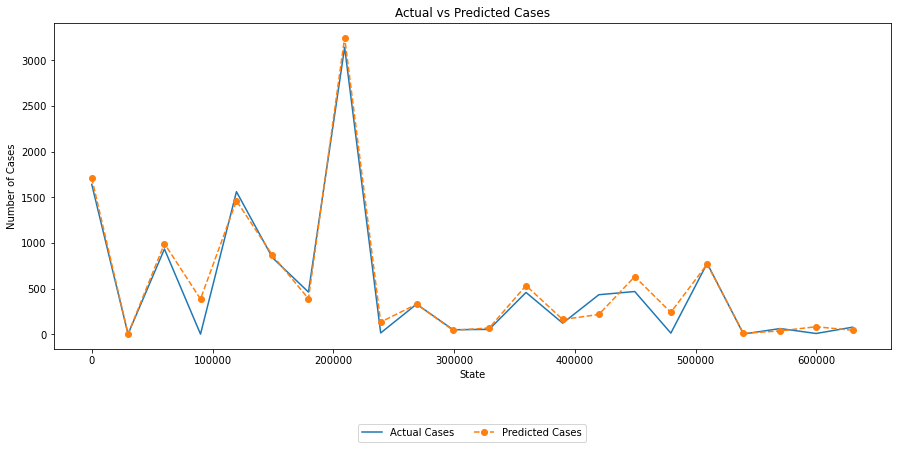

In [54]:
# Result of predicted cases and actual cases of entire dataset of testing
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 6))
# plot actual cases
plt.plot(df_sam.index, df_sam['cases'], label='Actual Cases')

# plot predicted cases
plt.plot(df_sam.index, df_sam['y_predicted'], linestyle='--', marker='o', label='Predicted Cases')



# set plot title and axis labels
plt.title('Actual vs Predicted Cases')
plt.xlabel('State')
plt.ylabel('Number of Cases')

# set legend
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3), ncol=2)

# show plot
plt.show()


In [ ]:
# Date wise cases comparisoon on testing dataset

In [55]:
import plotly.express as px 
import pandas as pd 
import numpy as np 

# data
#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')
fig = px.line(df_sam, x='date', y=df_sam.columns[0:2])

# Show plot 
fig.show()

In [130]:
#R2 score of all model training data set
dff1 = x.iloc[:,[1,5,9,13,17]]
dff1

,LinearRegressionT_R2,RidgeRegressionT_R2,LassoRegressionT_R2,GradientBoostingRegressorT_R2,KNNT_R2
0,0.765374,0.765374,0.765374,0.881245,0.999582
1,0.764979,0.764979,0.764979,0.879311,0.999571
2,0.764947,0.764947,0.764947,0.879221,0.999578
3,0.764601,0.764601,0.764601,0.881364,0.999582


In [135]:
# R2 score for model.
mean_values = dff1.mean().reset_index(name='mean')

# Create a radial bar chart using Plotly Express
fig = px.bar_polar(mean_values, r='mean', theta='index', color='index',
                   color_discrete_sequence=px.colors.sequential.Plasma_r)

# Update the layout of the chart
fig.update_layout(
    polar=dict(
        radialaxis=dict(showticklabels=False, ticks='', showgrid=False),
        angularaxis=dict(showticklabels=True, ticks=''))
)

# Display the chart
fig.show()


In [ ]:
# This is a secondry part of KNN where we implemented standardized data on training and get error rate high.

In [59]:
#remove column which is county, state 
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 
df11 = df.iloc[:, 4:]
# fit and transform the dataframe
df_scaled = scaler.fit_transform(df11)

# # convert the scaled data back to a pandas dataframe
df_scaled = pd.DataFrame(df_scaled, columns=df11.columns)

In [60]:
# Fold creation for standardized data.
df11 = create_folds(df_scaled)
df1.kfold.value_counts()

C:\Users\HP\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=6.



0.0    106777
5.0    106776
4.0    106776
1.0    106776
3.0    106776
2.0    106776
Name: kfold, dtype: int64

In [62]:
tdf = df11[df11['kfold'] <= 3]
vdf = df11[df11['kfold'] >3]

In [18]:
# declare Initial class for declaring function argumnets value.
#this is code for single model testing don't consider it.
class Configurations2:
    Num_Fold = 6
    Train_Fold = 4
    Seed = 42
    Fold_Type = 'STRATIFIED'
    Shuffle = True
    SAVE_MODEL = True
    Models = {
      
        'KNN': KNeighborsRegressor(n_neighbors=3)
       
    }
    

In [63]:
def run_folds(df, model_name, model, fold = 0):

    trainset = tdf[Tdf['kfold'] != fold]
    validset = vdf[Tdf['kfold'] == fold]

    X_train, Y_train = trainset.iloc[:, 1:-1], trainset.iloc[:, 0]
    X_valid, Y_valid = validset.iloc[:, 1:-1], validset.iloc[:, 0]

    model.fit(X_train, Y_train)
    y_train_pred = model.predict(X_train)
    y_valid_pred = model.predict(X_valid)

    train_rmse_score = np.sqrt(mean_squared_error(Y_train, y_train_pred))
    train_R2_score = r2_score(Y_train, y_train_pred)
    valid_rmse_score = np.sqrt(mean_squared_error(Y_valid, y_valid_pred))
    valid_R2_score = r2_score(Y_valid, y_valid_pred)

    print(f'MODEL : {model_name} FOLD : {fold} TRAIN_SCORE : {train_rmse_score} TRAIN_R2_SCORE : {train_R2_score} VALID_SCORE : {valid_rmse_score} VALID_R2_SCORE : {valid_R2_score}' )

    

    if Configurations2.SAVE_MODEL == True:
        joblib.dump(model, 'STD_Covid-19(40) '+ str(fold) + '_' +model_name+'.pkl')

    return train_rmse_score, valid_rmse_score, train_R2_score, valid_R2_score

In [20]:
temp = {}
for model_name, model in Configurations2.Models.items():
    train_scores = []
    tR2_score = []
    vR2_score = []
    valid_scores = []
    for i in range(Configurations2.Train_Fold):
        train_rmse_score,valid_rmse_score, train_R2_score, valid_R2_score = run_folds(tdf,model_name,model,fold=i)
        train_scores.append(train_rmse_score)
        tR2_score.append(train_R2_score)
        valid_scores.append(valid_rmse_score)
        vR2_score.append(valid_R2_score)
    print('\n')
    temp[model_name +'Train'] = train_scores
    temp[model_name + 'T_R2'] = tR2_score
    temp[model_name + 'valid'] = valid_scores
    temp[model_name + 'V_R2'] = vR2_score
    

temp_df = pd.DataFrame(temp)

MODEL : KNN FOLD : 0 TRAIN_SCORE : 762.3328550616603 TRAIN_R2_SCORE : 0.9925799632749652 VALID_SCORE : 1172.2358152808263 VALID_R2_SCORE : 0.9826258116365141
MODEL : KNN FOLD : 1 TRAIN_SCORE : 767.4131335894278 TRAIN_R2_SCORE : 0.9925233811308735 VALID_SCORE : 1183.6281616253964 VALID_R2_SCORE : 0.9819812244942794
MODEL : KNN FOLD : 2 TRAIN_SCORE : 774.4163268060721 TRAIN_R2_SCORE : 0.9923467521506506 VALID_SCORE : 1137.1164486918767 VALID_R2_SCORE : 0.9836266705814632
MODEL : KNN FOLD : 3 TRAIN_SCORE : 781.8208373250873 TRAIN_R2_SCORE : 0.9922238141218368 VALID_SCORE : 1140.162839686459 VALID_R2_SCORE : 0.983385417339489




In [ ]:
run_folds2(Tdf,model_name)

MODEL : KNN K_val : 7  TRAIN_SCORE : 1558.8871759440156 TRAIN_R2_SCORE : 0.9690190772350312 VALID_SCORE : 1780.4397240992134 VALID_R2_SCORE : 0.9598658054053144
MODEL : KNN K_val : 8  TRAIN_SCORE : 1654.6683506826569 TRAIN_R2_SCORE : 0.96509505962234 VALID_SCORE : 1860.4210810947861 VALID_R2_SCORE : 0.9561789776773792
MODEL : KNN K_val : 9  TRAIN_SCORE : 1733.4387921049652 TRAIN_R2_SCORE : 0.9616926594227696 VALID_SCORE : 1937.6425883979734 VALID_R2_SCORE : 0.9524656735827376
MODEL : KNN K_val : 10  TRAIN_SCORE : 1819.334061433333 TRAIN_R2_SCORE : 0.9578021930321108 VALID_SCORE : 2013.9815499630652 VALID_R2_SCORE : 0.9486463902395746


In [ ]:
# Because of these results we chose normal data of this project

In [11]:
#R2 score of all model training data set
dff2 = x.iloc[:,[0,4,8,12,16]]
dff2

,LinearRegressionTrain,RidgeRegressionTrain,LassoRegressionTrain,GradientBoostingRegressorTrain,KNNTrain
0,4288.841192,4288.841192,4288.843212,3051.257860,180.988462
1,4294.266408,4294.266408,4294.268400,3077.305191,183.459407
2,4298.732699,4298.732699,4298.734723,3081.438734,182.122987
3,4307.496960,4307.496960,4307.498980,3057.951456,181.408842


In [56]:
import plotly.graph_objs as go

mean = dff2.mean()

bar_fig = go.Figure(go.Bar(x=mean.index, y=mean.values, name='Training RMSE Value'))

line_fig = px.line(x=mean.index, y=mean.values, labels={'x': 'Model Name', 'y': 'Training RMSE Value'})

combined_fig = go.Figure()
for data in bar_fig.data + line_fig.data:
    combined_fig.add_trace(data)

combined_fig.update_layout(
    title='RMSE Value of model',
    xaxis_title='Model Name',
    yaxis_title='RMSE Value',
    width=800,
    height=800,
    barmode='group'
)

combined_fig.show()

In [19]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import pandas as pd
import numpy as np

dfx = df1.iloc[:,0:]


plot_rows=8
plot_cols=5
fig = make_subplots(rows=plot_rows, cols=plot_cols)

# add traces
x = 0
for i in range(1, plot_rows + 1):
    for j in range(1, plot_cols + 1):
        fig.add_trace(go.Box(y=dfx[dfx.columns[x]].values,
                             name=dfx.columns[x]),
                      row=i,
                      col=j)

        x=x+1

# Format and show fig
fig.update_layout(height=1200, width=1200)
fig.show()

        